# Gradient Descent

Gradient Descent (GD) is a fundamental optimization algorithm widely used in machine learning and mathematical optimization. It serves as the backbone for training various models, including linear regression, neural networks, and support vector machines. The main objective of Gradient Descent is to find the optimal parameters of a model that minimize or maximize a given objective function.

In the context of supervised learning, the objective function typically represents the loss or cost function, which measures the discrepancy between the model's predictions and the actual ground-truth labels. The goal of Gradient Descent is to iteratively update the model parameters in a way that reduces this discrepancy, effectively improving the model's performance.

The core idea behind Gradient Descent is to take small steps in the direction of the steepest descent (or ascent, for maximizing) of the objective function with respect to the model parameters. This direction is determined by the negative gradient of the objective function, which points towards the direction of the steepest decrease in the loss.



## Mathematical Formulation

Let's define the following terms for the mathematical formulation of SGD:

- $\theta$: Model parameters that we want to optimize.
- $J(\theta)$: The loss function that measures the difference between predicted and true labels.
- $\eta$: Learning rate, which controls the step size of parameter updates.
- $x$: The input data.
- $y$: The true labels corresponding to the input data.
- $\hat{y}$: The predicted labels of $y$.
- $f_\theta$: Parametric function, such that, $\hat{y} = f_\theta (x_n)$

Let us define the loss function as:  

$J(\theta) = \sum_{n=1}^{N} \mathcal{L}(y_n, f_\theta (x_n))$  

The objective of SGD is to find the optimal parameters $\theta^*$ that minimize the loss function $J(\theta)$:

$\theta^* = \arg \min_{\theta} J(\theta)$

The SGD algorithm can be summarized as follows:

1. Initialize the model parameters $\theta$ with random values.
2. Loop over the training data for a fixed number of epochs or until convergence is achieved.
3. At each iteration, randomly select a data point (or a mini-batch) from the training dataset.
4. Compute the gradient of the loss function with respect to the model parameters using the selected data point(s).
5. Update the model parameters using the computed gradient and the learning rate $\eta$.

The update rule for SGD can be expressed as:

$\theta_{i+1} = \theta_i - \eta \cdot \nabla J(\theta_i)$

where $\nabla J(\theta_i)$ represents the gradient of the loss function with respect to the model parameters $\theta_i$.

## Variants of GD

GD has several variants that incorporate additional techniques to improve convergence and stability. Some of the popular variants include:

1. **Mini-batch GD**: Instead of using all data points, it uses a small mini-batch of data points to compute the gradient at each iteration. This strikes a balance between efficiency and stability.

2. **Momentum**: Momentum introduces a momentum term that helps the optimization process to overcome oscillations and accelerate convergence. It accumulates a weighted average of past gradients to update the parameters.

3. **Nesterov Momentum**: Nesterov Momentum is an extension of classic Momentum that takes into account the lookahead position when computing the gradient, leading to faster convergence.

4. **RMSprop**: RMSprop adapts the learning rate for each parameter based on the root mean square of the past gradients. It helps to handle different scales of gradients and improves convergence.

5. **Adam**: Adam combines the ideas of Momentum and RMSprop. It adapts the learning rate for each parameter based on the first and second moments of the past gradients.

Each variant of SGD has its strengths and is suited for different scenarios. The choice of the variant often depends on the specific problem and the characteristics of the dataset.



## Mini-batch SGD

Let us assume that the dataset is split in M minibatches each of size K. Than we will obtain following sequences of data:  

$\underbrace{(x_{(1)}, y_{(1)}\dots x_{(K)}, y_{(K)})}_{minibatch \; 1} \dots \underbrace{(x_{((M-1)K+1)}, y_{((M-1)K+1)}\dots x_{(N)}, y_{(N)})}_{minibatch \; M}$  

Thus for each epoch we will perform M updates of $\theta$:  

$J^{(m)}(\theta) = \sum_{n=1}^{K}\mathcal{L}(y_{((m-1)K+n)}, f_{\theta}(x_{((m-1)K+n)}))$  

$\theta_{m+1} = \theta_{m} - \eta \cdot \nabla J^{(m)}(\theta_{m})$

## SGD with Momentum

One of the improvements is to add momentum term. Momentum takes into account the correction used in previous step as well as current gradient.   

Initialization:   
$\Delta \theta_0 = 0$ 

Thus for each epoch we will perform M updates of $\theta$:  

$\Delta\theta_{i+1} = \mu \Delta\theta_{i} - \eta \nabla J(\theta_i)$  

$\theta_{i+1} = \theta_{i} + \Delta\theta_{i+1}$  

where, 
- $\eta$: Learning rate, which controls the step size of parameter updates. Typical value 0.01.
- $\mu$: momentum factor. Typical values $\in$ \[0.5, 0.9\].

#### The effect of momentum term on convergence

The effect of momentum term on convergence is that step size increases when a number of consecutive gradients points to exactly same direction.  

Let us assume that the gradient is approximately the same over K succesive iterations and equal $g$.  

$\nabla J(\theta_i) = \nabla J(\theta_{i+1}) = g$  



**At some arbitrary initial timestep n:**  
At some arbitrary initial step $n$, before gradient became constant, the update rule for $ \Delta \theta $ is given by:

$$ \Delta \theta_{n+1} = \mu \cdot \Delta \theta_n - \eta \cdot g, $$

where $ \Delta \theta_n $ is the accumulated momentum up to arbitrary initial step $n$.


**At timestep (n+I):**  
We want to show that the formula also holds for the next iteration, $ k + 1 $:

$$ \Delta \theta_{n+I} = \mu \cdot \Delta \theta_{n+I-1} - \eta \cdot g. $$

We can substitute $ \Delta \theta_{n+I-1} $ in the above equation:

$$ \Delta \theta_{n+I} = \mu \cdot (\mu \cdot \Delta \theta_{n+I-1} - \eta \cdot g) - \eta \cdot g. $$

$$ \Delta \theta_{n+I} = \mu^2 \cdot \Delta \theta_{n+I-1} - \mu \cdot \eta \cdot g - \eta \cdot g. $$

$$ \Delta \theta_{n+I} = \mu^2 \cdot (\mu \cdot \Delta \theta_{n+I-2} - \eta \cdot g) - \mu \cdot \eta \cdot g - \eta \cdot g. $$

$$ \dots $$

$$ \Delta \theta_{n+I} = \mu^{I} \cdot \Delta \theta_n - \eta \cdot \sum_{i=0}^{I-1} \mu^i \cdot g. $$

Now, for a finite geometric series $ \sum_{i=0}^{I-1} \mu^i $ with a common ratio $ \mu $, we can use the formula:

$$ \sum_{i=0}^{I-1} \mu^i = \frac{1 - \mu^{I}}{1 - \mu}. $$


For the final iteration $ n+I $, we have:

$$ \Delta \theta_{n+I} = \mu^I \cdot \Delta \theta_n - \eta \cdot \frac{1 - \mu^I}{1 - \mu} \cdot g. $$

Now, if $ \mu^I $ is sufficiently small (typical when $ \mu < 1 $), and $I$ is large, then by taking limit, we can approximate $ \Delta \theta_{n+I} $ as:

$$ \lim_{I\to\infty}\Delta \theta_{n+I} = \lim_{I\to\infty} \mu^I \cdot \Delta \theta_n - \lim_{I\to\infty}\eta \cdot \frac{1 - \mu^I}{1 - \mu} \cdot g = 0 - \eta \cdot\frac{1}{1 - \mu}\cdot g = -\frac{\eta}{1 - \mu}\cdot g$$
That gives us:
$$\Delta \theta_{n+I} \approx  -\frac{\eta}{1 - \mu} \cdot g. $$

This approximation holds when $ I $ is sufficiently large and $ \mu $ is less than 1.



## Nesterov Momentum

Nesterov Momentum is an extension of the classic Momentum optimization algorithm. It addresses the issue of oscillations in the optimization process, allowing for faster convergence. In Nesterov Momentum, the algorithm considers the lookahead position when computing the gradient, which helps to better estimate the direction of the gradient and adjust the velocity accordingly.

The update rule for Nesterov Momentum is as follows:

1. Calculate the lookahead position $\theta_{\text{lookahead}}$:
   $$
   \theta^{(t)}_{\text{lookahead}} = \theta^{(t)} + \mu \cdot \Delta  \theta^{(t)}
   $$

2. Compute the gradient of the loss function with respect to the lookahead position $\theta_{\text{lookahead}}$:
   $$
   \nabla J(\theta^{(t)}_{\text{lookahead}})
   $$

3. Update the velocity using the previous velocity, learning rate $\eta$, and the gradient at the lookahead position:
   $$
   \Delta  \theta^{(t+1)} = \mu \cdot\Delta  \theta^{(t)} - \eta \cdot \nabla J(\theta^{(t)}_{\text{lookahead}})
   $$

4. Finally, update the model parameters using the velocity and the learning rate:
   $$
   \theta^{(t+1)}  = \theta^{(t)}  + \Delta  \theta^{(t+1)}
   $$

Nesterov Momentum effectively reduces oscillations and improves the convergence speed compared to classic Momentum, making it a powerful optimization technique.


### Nesterov Momentum update rule for NN
In frameworks such as pytorch and tensorflow, during optimizer update step we dont want to run all our data examples to obtain $\nabla J(\theta^{(t)}_{\text{lookahead}})$ at lookahead position. This prompts a reconfiguration of the update rule. We aim to enable our model to predict outcomes at the lookahead position before the optimizer step takes place. To facilitate this, we adjust the update process to not target $\theta$ but $\theta_{lookahead}$:  
$$
\begin{align*}
   \theta^{(t)}_{\text{lookahead}} = \theta^{(t)} + \mu \cdot \Delta  \theta^{(t)}
\end{align*}
$$
From here we get:
$$
\begin{align*}
   \theta^{(t)} = \theta^{(t)}_{\text{lookahead}} - \mu \cdot \Delta  \theta^{(t)}
\end{align*}
$$

The process of updating can be segmented into the following steps:
$$
\begin{align*}
\theta^{(t+1)}  &= \theta^{(t)}  + \Delta  \theta^{(t+1)}  \\
&= \theta^{(t)}_{\text{lookahead}}- \mu \cdot \Delta  \theta^{(t)} + \Delta  \theta^{(t+1)}
\end{align*}
$$
The update quantity $\Delta  \theta^{(t+1)}$ is defined as
$$
\begin{align*}
\Delta  \theta^{(t+1)} &= \mu \cdot\Delta  \theta^{(t)} - \eta \cdot \nabla J(\theta^{(t)}_{\text{lookahead}}) \\
&= \mu \cdot\Delta  \theta^{(t)} - \eta \cdot \nabla J(\theta^{(t)} + \mu \cdot \Delta  \theta^{(t)})
\end{align*}
$$
This equation can be reformulated with respect to the update of $\theta_{lookahead}$:
$$
\begin{align*}
 \theta^{(t+1)}_{\text{lookahead}} &= \theta^{(t+1)} + \mu \cdot \Delta  \theta^{(t+1)} \\
&=  \theta^{(t)}_{\text{lookahead}}- \mu \cdot \Delta  \theta^{(t)} + \Delta  \theta^{(t+1)} +   \mu \cdot \Delta  \theta^{(t+1)} \\
&= \theta^{(t)}_{\text{lookahead}}- \mu \cdot \Delta  \theta^{(t)} + \mu \cdot\Delta  \theta^{(t)} - \eta \cdot \nabla J(\theta^{(t)} + \mu \cdot \Delta  \theta^{(t)}) +   \mu \cdot \Delta  \theta^{(t+1)}\\
&= \theta^{(t)}_{\text{lookahead}}-  \eta \cdot \nabla J(\theta^{(t)} + \mu \cdot \Delta  \theta^{(t)}) +   \mu \cdot \Delta  \theta^{(t+1)}\\
&= \theta^{(t)}_{\text{lookahead}}-  \eta \cdot \nabla J(\theta^{(t)}_{\text{lookahead}}) +   \mu \cdot \Delta  \theta^{(t+1)}\\
&= \theta^{(t)}_{\text{lookahead}} +   \mu \cdot \Delta  \theta^{(t+1)} -  \eta \cdot \nabla J(\theta^{(t)}_{\text{lookahead}})\\
\end{align*}
$$

That is exactly how SGD with nesterov momentum is updated in tensorflow:  
```python
velocity = momentum * velocity - learning_rate * g
w = w + momentum * velocity - learning_rate * g
```
   



## RMSProp

RMSProp (Root Mean Square Propagation) is an adaptive learning rate optimization algorithm. It helps to handle the issues of varying gradient scales and ill-conditioned optimization surfaces. RMSProp adaptively adjusts the learning rate for each parameter based on the root mean square of the past gradients.

The update rule for RMSProp is as follows:

1. Initialize a moving average of the squared gradients:
   $$
   \text{v} = 0
   $$

2. Compute the squared gradients for each parameter using the decay rate $\gamma$:
   $$
   \text{v} = \gamma \cdot \text{v} + (1 - \gamma) \cdot (\nabla J(\theta))^2
   $$

3. Update the model parameters using the learning rate $\eta$ and the scaled gradient:
   $$
   \theta = \theta - \frac{\eta}{\sqrt{\text{v} + \epsilon}} \cdot \nabla J(\theta)
   $$

RMSProp adapts the learning rate for each parameter based on the history of gradients, allowing for faster convergence and better optimization performance.




## Adam

Adam (Adaptive Moment Estimation) is another adaptive learning rate optimization algorithm that combines the ideas of Momentum and RMSProp. It not only adapts the learning rate for each parameter but also keeps track of the first and second moments of the past gradients.

The update rule for Adam is as follows:

1. Initialize the first and second moment estimates:
   $$
   \text{m} = 0, \quad \text{v} = 0
   $$

2. Update the first moment estimate:
   $$
   \text{m} = \beta_1 \cdot \text{m} + (1 - \beta_1) \cdot \nabla J(\theta)
   $$

3. Update the second moment estimate:
   $$
   \text{v} = \beta_2 \cdot \text{v} + (1 - \beta_2) \cdot (\nabla J(\theta))^2
   $$

4. Compute bias-corrected first and second moment estimates:
   $$
   \hat{\text{m}} = \frac{\text{m}}{1 - \beta_1^t}, \quad \hat{\text{v}} = \frac{\text{v}}{1 - \beta_2^t}
   $$

5. Update the model parameters using the learning rate $\eta$ and the bias-corrected estimates:
   $$
   \theta = \theta - \frac{\eta}{\sqrt{\hat{\text{v}}} + \epsilon} \cdot \hat{\text{m}}
   $$

Adam efficiently combines the benefits of both Momentum and RMSProp, making it a popular choice for optimizing deep learning models.

These optimization algorithms offer various improvements over traditional Gradient Descent and play a crucial role in training complex machine learning models effectively and efficiently. The choice of the optimization algorithm depends on the specific problem, dataset, and model architecture.



```python
def update_parameters(self, parameters, gradient):
        self.momentum = self.betas[0]*self.momentum + (1-self.betas[0])*gradient
        self.velocity = self.betas[1]*self.velocity + (1-self.betas[1])* gradient**2
        momentum_corrected = self.momentum/(1-self.betas[0])
        velocity_corrected = self.velocity/(1-self.betas[1])
        parameters -= self.learning_rate/(np.sqrt(velocity_corrected) + self.eps)*momentum_corrected
        return parameters
```

### Experiment with RMSProp momentum:

/home/mikhail/PythonProjects/ML-Algorithms-From-Scratch/mllib/optimizers.py:66: UserWarning: Algorithm did not converge!
  warnings.warn("Algorithm did not converge!")


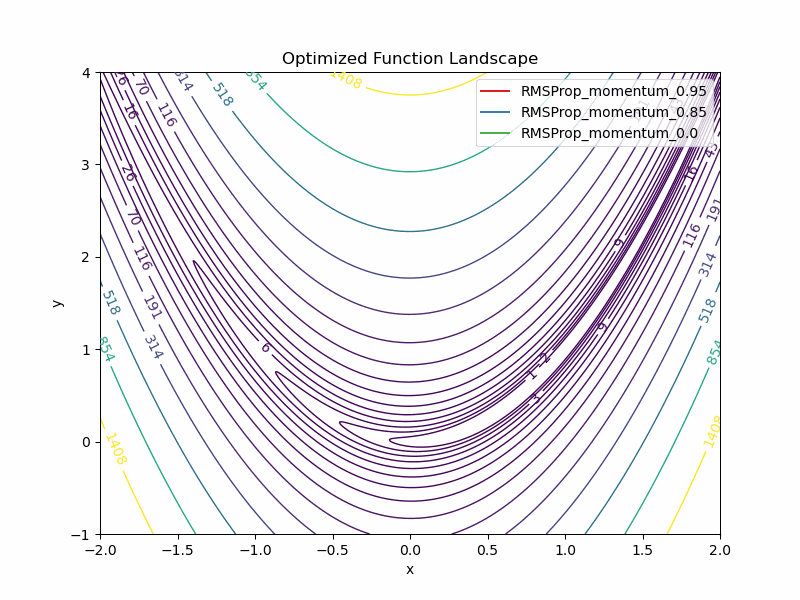

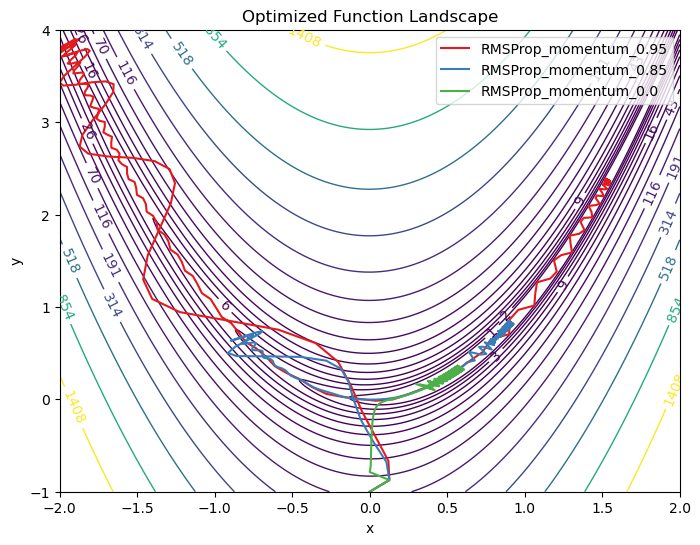

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from mllib.optimizers import SGD, RMSProp, Adam, SGDNAG
from matplotlib.animation import FuncAnimation
from IPython.display import Image

# Define the Rosenbrock function
def rosenbrock(a, b, parameters):
  x = parameters[0]
  y = parameters[1]
  a = 1
  b = 100
  return (a - x)**2 + b * (y - x**2)**2

def rosenbrock_gradient(a, b, parameters):
  x = parameters[0]
  y = parameters[1]
  a = 1
  b = 100
  df_dx = -2 * (a - x) - 2 * b * (y - x**2) * 2 * x
  df_dy = 2 * b * (y - x**2)
  return np.array([df_dx, df_dy])

# Define the valleys landscape function
def valleys(a, b, parameters):
  x = parameters[0]
  y = parameters[1]
  z = 3*np.exp(-((x + 1)**2+(y + 2)**2)) + \
      np.exp(-0.1*(2*(x + 2)**2+(y -0.5)**2)) + \
      3*np.exp(-1.5*((x -1)**2+2*(y + 1.5)**2)) + \
      1.5*np.exp(-(1*(x + 1.5)**2+3*(y + 0.5)**2)) + \
      4*(1 - np.exp(-((x+y)**2+0.05*x**2)))
  return z

def valleys_gradient(a, b, parameters):
  x = parameters[0]
  y = parameters[1]

  dz_dx = 3*(3.0 - 3.0*x)*np.exp(-1.5*(x - 1)**2 - \
     6.75*(2/3*y + 1)**2) - 4*(-2.1*x - 2*y)*np.exp(-0.05*x**2 - \
       (x + y)**2) + 1.5*(-2.0*x - 3.0)*np.exp(-2.25*(2/3*x + 1)**2 - \
        3*(y + 0.5)**2) + 3*(-2*x - 2)*np.exp(-(x + 1)**2 - (y + 2)**2) + \
          (-0.4*x - 0.8)*np.exp(-0.2*(x + 2)**2 - 0.1*(y - 0.5)**2)
          
  dz_dy = (0.1 - 0.2*y)*np.exp(-0.2*(x + 2)**2 - 0.1*(y - 0.5)**2) - 4*(-2*x - 2*y)*np.exp(-0.05*x**2 - \
    (x + y)**2) + 3*(-6.0*y - 9.0)*np.exp(-1.5*(x - 1)**2 - 6.75*(2/3*y + 1)**2) + \
    1.5*(-6*y - 3.0)*np.exp(-2.25*(2/3*x + 1)**2 - 3*(y + 0.5)**2) + \
    3*(-2*y - 4)*np.exp(-(x + 1)**2 - (y + 2)**2)
  
  return np.array([dz_dx, dz_dy])

# Define the Ackley function
def ackley(a, b, parameters):
    x = parameters[0]
    y = parameters[1]
    a = 20
    b = 0.2
    c = 2 * np.pi
    term1 = -a * np.exp(-b * np.sqrt(0.5 * (x**2 + y**2)))
    term2 = -np.exp(0.5 * (np.cos(c * x) + np.cos(c * y)))
    return term1 + term2 + a + np.exp(1)

def ackley_derivative(a, b, parameters):
    x = parameters[0]
    y = parameters[1]
    a = 20
    b = 0.2
    c = 2 * np.pi
    sqrt_term = np.sqrt(0.5 * (x**2 + y**2))
    cos_term_x = np.cos(c * x)
    cos_term_y = np.cos(c * y)
    
    derivative_x = -a * (-b) * (x / sqrt_term) * np.exp(-b * sqrt_term) \
                   + 0.5 * c * np.sin(c * x) * np.exp(0.5 * (cos_term_x + cos_term_y))
    
    derivative_y = -a * (-b) * (y / sqrt_term) * np.exp(-b * sqrt_term) \
                   + 0.5 * c * np.sin(c * y) * np.exp(0.5 * (cos_term_x + cos_term_y))
    
    return np.array([derivative_x, derivative_y])
# Create a grid of points for visualization
x_vals = np.linspace(-2, 2, 500)
y_vals = np.linspace(-1, 4, 500)
X, Y = np.meshgrid(x_vals, y_vals)
Z = rosenbrock(0,0, np.stack([X, Y]))


# Initialize optimizer
initial_params =  np.array([-0, -1.])  # Starting point
lr = 0.04


opts = {"RMSProp_momentum_0.95": RMSProp, "RMSProp_momentum_0.85": RMSProp, "RMSProp_momentum_0.0": RMSProp}
opts_args = {
              "RMSProp_momentum_0.95": {"loss_fn": rosenbrock, "gradient_fn": rosenbrock_gradient, 
                     "parameters": initial_params.copy(), "learning_rate": lr, "max_iter": 200, "momentum": 0.95},
              "RMSProp_momentum_0.85": {"loss_fn": rosenbrock, "gradient_fn": rosenbrock_gradient, 
                     "parameters": initial_params.copy(), "learning_rate": lr, "max_iter": 200, "momentum": 0.85},
              "RMSProp_momentum_0.0": {"loss_fn": rosenbrock, "gradient_fn": rosenbrock_gradient, 
                     "parameters": initial_params.copy(), "learning_rate": lr, "max_iter": 200, "momentum": 0.0}
            }
            
def plot_optimizers(optimizer_dict, opt_kwargs):
  from matplotlib import colormaps

  name = "Set1"
  cmap = colormaps[name]  
  colors = cmap.colors 

  opts = []
  histories = []
  opts_names = list(optimizer_dict.keys())
  for opt in optimizer_dict:
    op = optimizer_dict[opt](**opt_kwargs[opt])
    op.optimize(np.array([0.0]), np.array([0.0]))
    opts.append(op)
    histories.append(np.array(op.history["parameters"]))

  # Plot function landscape
  fig, ax = plt.subplots(figsize=(8, 6))
  levels = list(map(lambda x: np.exp(x/4), range(1, 30, 2)))
  CS = plt.contour(X, Y, Z, levels=levels, cmap="viridis", linewidths=1)
  plt.clabel(CS, inline=1, fontsize=10)
  for i, hist in enumerate(histories):
    plt.plot(hist[:, 0], hist[:, 1], color=colors[i], label=opts_names[i])
  plt.title("Optimized Function Landscape")
  plt.xlabel("x")
  plt.ylabel("y")
  plt.legend()
  plt.show()

def plot_optimizers_anim(optimizer_dict, opt_kwargs, plot_name="rosenbrock", levels_div=4, levels=None):
  from matplotlib import colormaps

  name = "Set1"
  cmap = colormaps[name]  # type: matplotlib.colors.ListedColormap
  colors = cmap.colors  # type: list

  opts = []
  histories = []
  opts_names = list(optimizer_dict.keys())
  for opt in optimizer_dict:
    op = optimizer_dict[opt](**opt_kwargs[opt])
    op.optimize(np.array([0.0]), np.array([0.0]))
    opts.append(op)
    histories.append(np.array(op.history["parameters"]))

  # Plot the Landscape function landscape
  fig, ax = plt.subplots(figsize=(8, 6))
  if not levels:
    levels = list(map(lambda x: np.exp(x/levels_div), range(1, 30, 2)))
  CS = plt.contour(X, Y, Z, levels=levels, cmap="viridis", linewidths=1)
  plt.clabel(CS, inline=1, fontsize=10)

  lines = []
  for i, hist in enumerate(histories):
      line, = plt.plot([], [], color=colors[i], label=opts_names[i])
      lines.append(line)

  def animate(frame):
      for i, line in enumerate(lines):
          line.set_data(histories[i][:frame, 0], histories[i][:frame, 1])
      return lines

  anim = FuncAnimation(fig, animate, frames=max(len(hist) for hist in histories), interval=200, blit=True)

  plt.title("Optimized Function Landscape")
  plt.xlabel("x")
  plt.ylabel("y")
  plt.legend()

  anim.save("./assets/optimization_animation_" + plot_name + ".gif", writer="pillow")
  #plt.close()

#plot_optimizers(opts, opts_args)
plot_optimizers_anim(opts, opts_args)
Image("./assets/optimization_animation_rosenbrock.gif")

/home/mikhail/PythonProjects/ML-Algorithms-From-Scratch/mllib/optimizers.py:66: UserWarning: Algorithm did not converge!
  warnings.warn("Algorithm did not converge!")


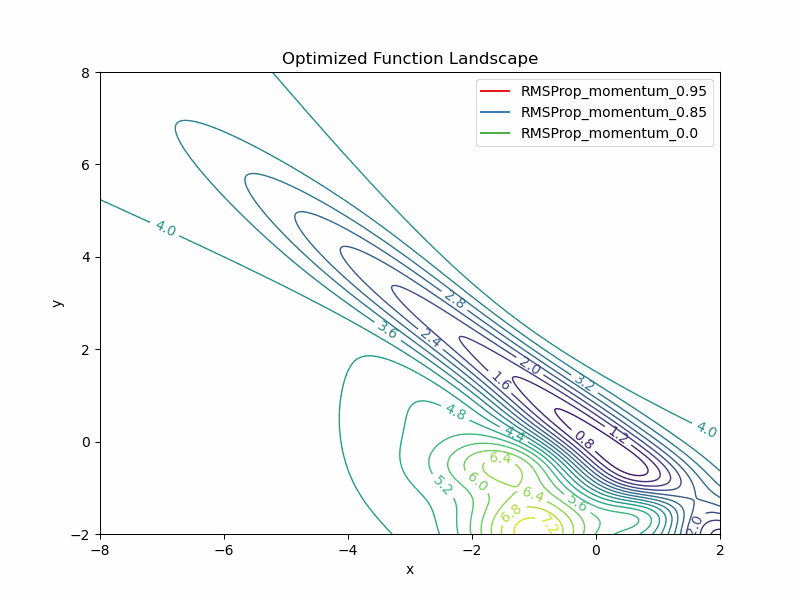

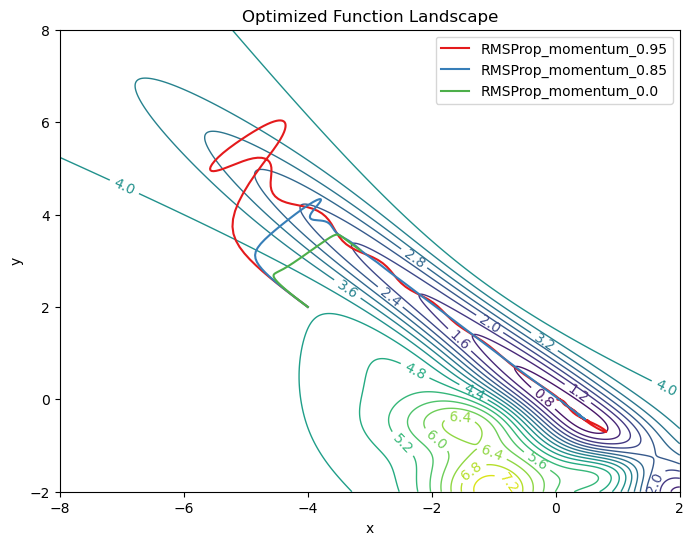

In [37]:
# Create a grid of points for visualization
x_vals = np.linspace(-8, 2, 500)
y_vals = np.linspace(-2, 8, 500)
X, Y = np.meshgrid(x_vals, y_vals)
Z = valleys(0,0, np.stack([X, Y]))

# Initialize optimizer
initial_params =  np.array([-4.0, 2])  # Starting point
lr = 0.01


opts = {"RMSProp_momentum_0.95": RMSProp, "RMSProp_momentum_0.85": RMSProp, "RMSProp_momentum_0.0": RMSProp}
opts_args = {
              "RMSProp_momentum_0.95": {"loss_fn": valleys, "gradient_fn": valleys_gradient, 
                     "parameters": initial_params.copy(), "learning_rate": lr, "max_iter": 200, "momentum": 0.95},
              "RMSProp_momentum_0.85": {"loss_fn": valleys, "gradient_fn": valleys_gradient, 
                     "parameters": initial_params.copy(), "learning_rate": lr, "max_iter": 200, "momentum": 0.85},
              "RMSProp_momentum_0.0": {"loss_fn": valleys, "gradient_fn": valleys_gradient,
                     "parameters": initial_params.copy(), "learning_rate": lr, "max_iter": 200, "momentum": 0.0}
            }
#plot_optimizers(opts, opts_args)
plot_optimizers_anim(opts, opts_args, plot_name="valleys", levels=20)
Image("./assets/optimization_animation_valleys.gif")